Main contributor: @Shashank Saurav

# Models

## Importing Relevant Libraries

In [1]:
import numpy as np
import math
import pandas as pd
from pyspark.sql import functions as F
from pyspark.ml.feature import OneHotEncoder, StringIndexer, MinMaxScaler, VectorAssembler, StandardScaler
from pyspark.sql.types import *
from pyspark.sql.functions import col, udf
import numpy as np
import pandas as pd
from pyspark.sql import functions as F
from pyspark.ml.feature import *
from pyspark.sql.types import *
from pyspark.ml.linalg import *
from pyspark.sql.functions import *
from pyspark.ml.classification import GBTClassifier, RandomForestClassifier, LogisticRegression
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml import PipelineModel
from pyspark.ml.stat import Correlation
import seaborn as sns
import pickle
import os
import matplotlib.pyplot as plt
from pyspark.ml.tuning import ParamGridBuilder
import pickle

## Reading Relevant csv files to Spark Dataframe

In [2]:
# Reading train_features.csv

# File location and type
file_location = "../lish-moa/train_features.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
features_data = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

In [3]:
# Reading train_targets_scored.csv

# File location and type
file_location = "../lish-moa/train_targets_scored.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
targets_data = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

## Data  Cleaning and Pre-Processing

### 1. Dropping samples with cp_type = 'ctl_vehicle' (placebo group would have no activations in any MoAs) 
We see from our analysis that ctl_vehicle is a placebo group that have no activations in any MoAs. We remove the samples with this cp_type class because our model will not learn from these samples

In [4]:
# Dropping samples with cp_type = 'ctl_vehicle' (placebo group would have no activations in any MoAs) 
features_and_targets = features_data.join(targets_data, features_data.sig_id == targets_data.sig_id, how='inner').drop(targets_data.sig_id)
features_and_targets = features_and_targets.filter("cp_type = 'trt_cp'")

### 2. One Hot Encoding nominal feature 'cp_dose'
We use **One-Hot-Encoding** to encode the categorical cp_dose variable. We then get two numerical columns that are indicators for the cp_dose classes, and we drop the original cp_dose variable to avoid having the same variables in the dataset.

In [5]:
# One hot encoding cp_dose

# Indexing different categories in cp_type and storing in column 'cp_type_index'
string_indexer = StringIndexer(inputCol = 'cp_dose', outputCol = 'cp_dose_index')
features_and_targets = string_indexer.fit(features_and_targets).transform(features_and_targets).drop('cp_dose')

# One hot encoded and stored in cp_type_vector column
encoder = OneHotEncoder(inputCols=['cp_dose_index'],
                        outputCols=['cp_dose'], dropLast = False)

features_and_targets = encoder.fit(features_and_targets).transform(features_and_targets).drop('cp_dose_index')

### 3. Label Encoding ordinal feature 'cp_time' (treatment time)
We also encode the ordinal feature cp_time into 0s and 1s representation and drop the original numeric representation after label encoding

In [6]:
# Label Encoding cp_time

# Assembling input columns to be label encoded to a vector 
assembler = VectorAssembler(inputCols = ['cp_time'], outputCol = 'cp_time_vector')
features_and_targets = assembler.transform(features_and_targets).drop('cp_time')

# Min-Max Scaler to label encode
mm_scaler = MinMaxScaler(inputCol = 'cp_time_vector', outputCol = 'cp_time_scaled_vector', min = 0, max = 2)
features_and_targets = mm_scaler.fit(features_and_targets).transform(features_and_targets).drop('cp_time_vector')

# UDF to transform encoded vector to scaler value 
firstElement=udf(lambda v:float(v[0]),FloatType())

features_and_targets = features_and_targets.withColumn('cp_time', firstElement(features_and_targets['cp_time_scaled_vector'])).drop('cp_time_scaled_vector')

## Stratified Train-Test Split
Based on our previous analysis of the training data, we know that the data is highly unbalanced. In response to this problem, we used stratified K-Fold cross validation. The idea is to perform downsampling on the majority label class and upsampling on the minority label class and return this stratified dataset. Then based on the stratified dataset we can perform K-Fold cross validation by fitting models with different hyperparameters to assess performance based on the defined metrics.

In [7]:
'''
The idea is that first every combination of target label vector is encoded, and then stratified train-test split is
done based on that encoded value. In the scenario, there would be some samples for all possible different 
combinations of target labels in both train and test set.
'''

# udf which converts a label vector to string i.e. a string contating all labels seperated by ' '
def vector_to_string(a):
  s=''
  for i in a:
    s = s + str(i) + ' '
  s.strip()
  return s
    
  
vector_to_string = udf(vector_to_string)   
spark.udf.register("vector_to_string", vector_to_string)

# Target columns names
target_names = []
for feature in targets_data.columns:
  if feature != 'sig_id':
    target_names.append(feature)

# converting label vectors to string i.e. a string contating all labels seperated by ' ' and storing into 'target_vector' column    
temp_df = features_and_targets.withColumn('target_vector', (vector_to_string(array([features_and_targets[col] for col in target_names])))).select(['sig_id', 'target_vector'])

# Encoding different possible combinations of target labels and storing the encoded value to 'target' column
string_indexer = StringIndexer(inputCol = 'target_vector', outputCol = 'target')
string_indexer_model = string_indexer.fit(temp_df)
temp_df = string_indexer_model.transform(temp_df).drop('target_vector')

# Joining features and targets data on 'sig_id'
data = features_and_targets.join(temp_df, features_and_targets.sig_id == temp_df.sig_id, how = 'inner').drop(temp_df.sig_id)

# Defining split ratio (80-20) for each unique value of target labels encoding (target)
unique_targets = data.select('target').distinct().collect()
fraction = {}
split_ratio = 0.2
for row in unique_targets:
  fraction[row.target] = split_ratio
  
# Startified train-test split
test_data = data.sampleBy('target', fractions=fraction, seed = 0)
data.createOrReplaceTempView('data_table')
test_data.createOrReplaceTempView('test_data_table')
train_data = spark.sql('select * from data_table as t1 where t1.sig_id not in (select t2.sig_id from test_data_table as t2)') 

# Asserting no data leakage
train_data.createOrReplaceTempView('train_data_table')
count = spark.sql('select * from train_data_table as t1 where t1.sig_id in (select t2.sig_id from test_data_table as t2)').count()
assert count == 0

# Dropping encoded target labels from both train and test
train_data = train_data.drop('target')
test_data = test_data.drop('target')

In [8]:
gene_feature_names = [] # list containing gene expression names
cell_feature_names = [] # list containing cell viability names

for i in range(772):
  gene_feature_names.append('g-' + str(i))

for i in range(100):
  cell_feature_names.append('c-' + str(i))

other_feature_names = ['sig_id', 'cp_type', 'cp_time', 'cp_dose'] # list containing other feature names

target_names = [col for col in train_data.columns if col not in gene_feature_names + cell_feature_names + other_feature_names] # list containing target names

## Feature Engineering

### Engineering new features: max and min values for gene expression and cell viability data
Engineered several features that describes the statistics of the rows for both gene and cell data. Here we look at the max and min value from both gene and cell from each row and we later append this to the dataframe

In [9]:
# Engineering new features: max and min values for gene expression and cell viability data

max_gene_train_df = train_data.withColumn("gene_max", F.greatest(*gene_feature_names)).select('sig_id', 'gene_max')
min_gene_train_df = train_data.withColumn("gene_min", F.least(*gene_feature_names)).select('sig_id', 'gene_min')
max_cell_train_df = train_data.withColumn("cell_max", F.greatest(*cell_feature_names)).select('sig_id', 'cell_max')
min_cell_train_df = train_data.withColumn("cell_min", F.least(*cell_feature_names)).select('sig_id', 'cell_min')

max_gene_test_df = test_data.withColumn("gene_max", F.greatest(*gene_feature_names)).select('sig_id', 'gene_max')
min_gene_test_df = test_data.withColumn("gene_min", F.least(*gene_feature_names)).select('sig_id', 'gene_min')
max_cell_test_df = test_data.withColumn("cell_max", F.greatest(*cell_feature_names)).select('sig_id', 'cell_max')
min_cell_test_df = test_data.withColumn("cell_min", F.least(*cell_feature_names)).select('sig_id', 'cell_min')

## Feature Selection

### Correlation map to infer about highly correlated gene expressions and cell viability features in the train set
We used a correlation matrix to look at the correlation on a subset of gene and cell data. Based on the beloew heatmap we see that many features are highly correlated with one another. This is an indicator that we should remove some of these features in the dataset such that during the model training phase, we can reduce the chances of multicollinearity, possible bias, and have better interpretation of the models.

In [10]:
# Finding correalation matrix among gene expressions and cell viability data in the train set

cont_features = gene_feature_names + cell_feature_names
cont_features_df = train_data.select(cont_features)

va = VectorAssembler(inputCols = cont_features, outputCol = 'features')
cont_features_df = va.transform(cont_features_df)
corr_df = Correlation.corr(cont_features_df, 'features', 'pearson').collect()[0][0]

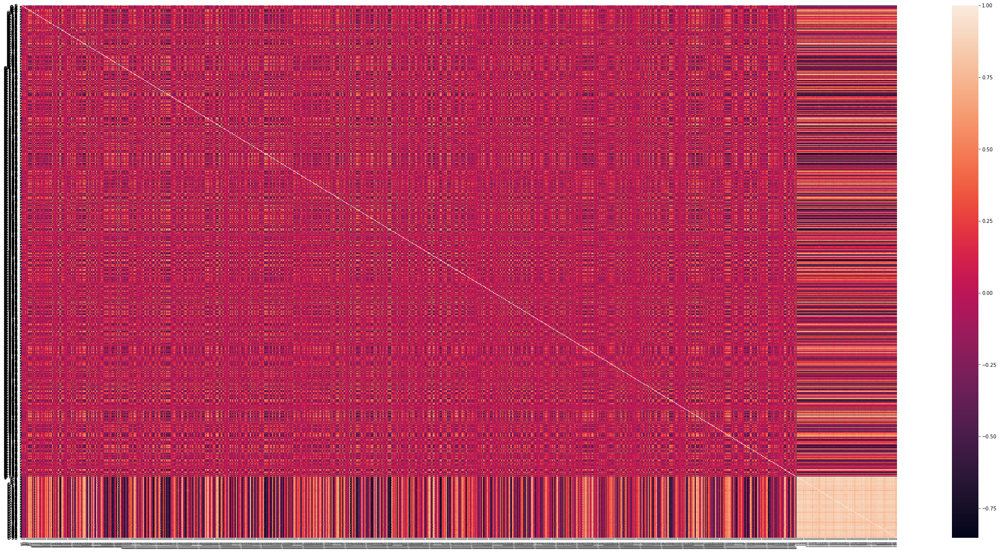

In [11]:
# Converting to correlation map to pandas df for visualization
corr_mat = corr_df.toArray()

plt.figure(figsize=(40,20))
sns.heatmap(corr_mat, xticklabels = gene_feature_names + cell_feature_names, yticklabels=gene_feature_names + cell_feature_names)
plt.xticks(rotation = 90, fontsize = 5)
plt.show()

#### As seen from the plot, some of the cell_viability features are highly corrleated

### Removing highly correlated continuos features

In [12]:
threshold = 0.6 # correlation threshold 

# Removing features whose correlation < -threshold or > threshold
columns = np.full((corr_mat.shape[0], ), True, dtype = bool)
for i in range(corr_mat.shape[0]):
  for j in range(i+1, corr_mat.shape[0]):
    if not columns[j]:
      continue
    if corr_mat[i,j] >= threshold or corr_mat[i,j] <= -threshold :
      if columns[j]:
        columns[j] = False

selected_features = [(gene_feature_names + cell_feature_names)[i] for i, j in enumerate(columns) if j==True]

In [13]:
# Number of features (out of gene expressions and cell viability) retained after removing highly correlated features
len(selected_features)

530

## Data Pre-Processing

### 1. Selecting Non Redundant Features (as obtained from correlation map) and Adding Engineered  Features 

In [14]:
train_data = train_data.select(other_feature_names + selected_features + target_names)#.join(max_gene_train_df, on = 'sig_id', how = 'inner').join(min_gene_train_df, on = 'sig_id', how = 'inner').join(max_cell_train_df, on = 'sig_id', how = 'inner').join(min_cell_train_df, on = 'sig_id', how = 'inner')
test_data = test_data.select(other_feature_names + selected_features + target_names)#.join(max_gene_test_df, on = 'sig_id', how = 'inner').join(min_gene_test_df, on = 'sig_id', how = 'inner').join(max_cell_test_df, on = 'sig_id', how = 'inner').join(min_cell_test_df, on = 'sig_id', how = 'inner')

In [15]:
# Updating selected features to include engineered features a
selected_features = selected_features + ['gene_max', 'gene_min', 'cell_max', 'cell_min']

### 2. Standardizing all the Continuous Features 

In [16]:
va = VectorAssembler(inputCols = selected_features, outputCol = 'feature_vector')

train_data = va.transform(train_data)
test_data = va.transform(test_data)

# Fitting Standard Scaler to train data
ss = StandardScaler(withMean=True, inputCol = 'feature_vector', outputCol='features')
ss_model = ss.fit(train_data)

# Transforming the train and test data with the fitted Standard Scaler model
train_data = ss_model.transform(train_data).drop('feature_vector')
test_data = ss_model.transform(test_data).drop('feature_vector')

### 3. Dimensionality Reduction through PCA 
We reduced the dimensions of the dataset by applying principal component analysis (PCA) with one hundred principal components. The cumulative explained variance from the one hundred principal components exceeds 65%. Using PCA reduced the dataset from 875 features to just 100 principal features, because of this, the time it took to train models was also drastically reduced.

In [17]:
k = 100 # Number of principal components
pca = PCA(k = k, inputCol='features', outputCol='pca_features')

# Fitting PCA to train data
pca_model = pca.fit(train_data)

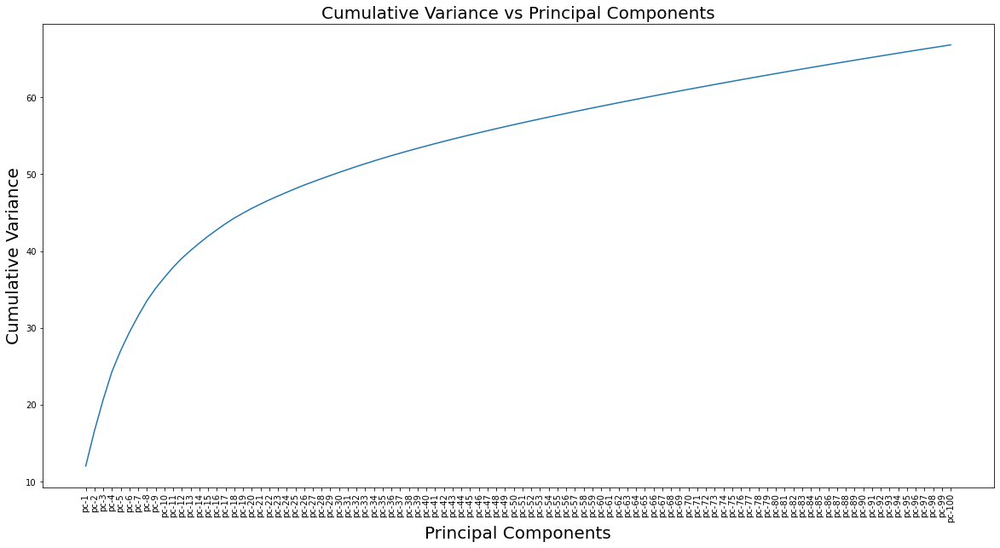

In [18]:
# Converting to numpy array for visulaization of Cumulative Variance of Principal Components
cum_var = np.cumsum(pca_model.explainedVariance.toArray())

xlabels = ['pc-' + str(i+1) for i in range(k)]
plt.figure(figsize=(20,10))
plt.plot(xlabels, cum_var*100)
plt.xticks(rotation = 90, fontsize = 10)
plt.yticks(fontsize = 10)
plt.xlabel('Principal Components', fontsize = 20)
plt.ylabel('Cumulative Variance', fontsize = 20)
plt.title('Cumulative Variance vs Principal Components', fontsize = 20)
plt.show()

In [19]:
# Transforming the train and test data with the fitted PCA model 

train_data = pca_model.transform(train_data).drop('features')
test_data = pca_model.transform(test_data).drop('features')

In [20]:
# Caching the processed train and test data

train_data = train_data.select(['cp_time', 'cp_dose', 'pca_features'] + target_names).cache()
test_data = test_data.select(['cp_time', 'cp_dose', 'pca_features'] + target_names).cache()

In [23]:
train_data.show();

In [25]:
test_data.show();

## Training and Testing

In [24]:
# Binary Cross Entropy Loss (called when all the samples in the train set has label 0 (and hence no model is trained)
# otherwise inbuilt evaluator is used) 
def logloss(predictedProb, trueLabel):
    '''
    Function to calculate BCE
    
    Parameters:
    predictedProb: array of predicted probabilities
    trueLabel: array of true labels
    
    Returns:
    loss: float BCE loss
    '''
    loss = (-trueLabel*np.log(predictedProb + 10e-15) - (1-trueLabel)*(np.log(1-predictedProb))).mean()
    return loss

## A. Logistic Regression Model

In [36]:
loss = 0
losses = [] # list to store loss/label
hamming_losses = [] # list to store progression of hamming loss after each label
untrained_labels = [] # list to store labels for which no model was trained (i.e. all samples in the train set had label 0)

# Looping over each target label and fitting a separate binary classifier
for i, label in enumerate(target_names):  
  
  # Selecting relevant columns from the train and test data 
  X_train = train_data.select(['cp_time', 'cp_dose', 'pca_features'] + [label]) 
  X_test = test_data.select(['cp_time', 'cp_dose', 'pca_features'] + [label])
  one_count_train = X_train.filter(X_train[label] == 1).count() # Number of samples with label 1 in train set
  zero_count_train = X_train.filter(X_train[label] == 0).count() # Number of samples with label 0 in train set
  
  # if there are no samples in the train set with label 1, no model is trained, always output 0 for the label    
  if one_count_train == 0:
    untrained_labels.append(label) # logging the labels for which no model was trained
    # Predicted Probability will be 0 for the label in test data
    n = X_test.count()
    prob = np.array([0]*n)
    label = np.array(X_test.select(label).toPandas())[:,0]
    l = logloss(prob, label)
    print('No need to train the model. Will always output 0 for this label')
   
  # if there is atleast 1 sample in the train set with label 1, a binary classifier is fitted     
  else:
    '''
    Handling class imbalance: 
    
    If number of samples with label 0 >= 2* number of samples with label 1, then downsample (without replacement) 
    class 0 to half and then upsample (with replacement) class 1 to have same number as class 0
    '''
    factor = zero_count_train/one_count_train
    if factor>=2:
      # downsample without replacement  
      zero_samples = X_train.filter(X_train[label]==0).sample(fraction = 0.5, withReplacement = False,  seed = 0)
      # upsample with replacement  
      one_samples = spark.createDataFrame(X_train.filter(X_train[label]==1).toPandas().sample(n = int(X_train.filter(X_train[label]==0).count()/2), replace = True,  random_state = 0))
      X_train = zero_samples.union(one_samples).orderBy(rand())
    
    # Assembleing features into a vector in train and test set
    va = VectorAssembler(inputCols = ['cp_time', 'cp_dose', 'pca_features'], outputCol = 'features')
    X_train = va.transform(X_train)
    X_test = va.transform(X_test)
    
    # Fitting a Logistic Regression model to the train set
    logisticRegression = LogisticRegression(labelCol = label)
    print('Training Logistic Regression Model')
    logisticRegressionModel = logisticRegression.fit(X_train)
    print('Logistic Regression Trained')
    # Testing the trained Logistic Regression model on the test set 
    pred_df = logisticRegressionModel.transform(X_test)
    evaluator = MulticlassClassificationEvaluator(labelCol=label, metricName='logLoss')
    l= evaluator.evaluate(pred_df) # test loss
    
  # Logging  
  losses.append(l) # logging test loss/label
  print(f'Label Loss for {i}: {label} = {l}')
  loss+=l
  hamming_loss = loss/(i+1)
  hamming_losses.append(hamming_loss) # logging progression of hamming loss after every label 
  print(f'Hamming Loss after {i}: {label} = {hamming_loss}')
  d = {'losses': losses, 'untrained_labels': untrained_labels, 'hamming_losses': hamming_losses}
  # Writing the loss to a pickle file    
  f = open('data_lr.pkl', 'wb')
  pickle.dump(d, f)
  f.close()  
  print('################################')

Training Logistic Regression Model
Logistic Regression Trained
Label Loss for 0: 5-alpha_reductase_inhibitor = 0.11037790683091275
Hamming Loss after 0: 5-alpha_reductase_inhibitor = 0.11037790683091275
################################
Training Logistic Regression Model
Logistic Regression Trained
Label Loss for 1: 11-beta-hsd1_inhibitor = 0.13140520438571307
Hamming Loss after 1: 11-beta-hsd1_inhibitor = 0.12089155560831291
################################
Training Logistic Regression Model
Logistic Regression Trained
Label Loss for 2: acat_inhibitor = 0.3224041196949535
Hamming Loss after 2: acat_inhibitor = 0.18806241030385976
################################
Training Logistic Regression Model
Logistic Regression Trained
Label Loss for 3: acetylcholine_receptor_agonist = 0.574879321523769
Hamming Loss after 3: acetylcholine_receptor_agonist = 0.28476663810883707
################################
Training Logistic Regression Model
Logistic Regression Trained
Label Loss for 4: acetylch

In [37]:
with open('data_lr.pkl', 'rb') as f:
    data = pickle.load(f)

In [38]:
# Writing other model artifacts to a pickle file 
data['train_data'] = train_data.toPandas()
data['test_data'] = test_data.toPandas()
data['variance'] = pca_model.explainedVariance.toArray()
data['cumulative_variance'] = cum_var
data['correlation_matrix'] = corr_mat
data['selected_features'] = selected_features

with open('data_lr.pkl', 'wb') as f:
    pickle.dump(data, f)

##  Results

In [26]:
with open('data_lr.pkl', 'rb') as f:
    data = pickle.load(f)

### 1. Plot of BCE loss for each target label in the test dataset

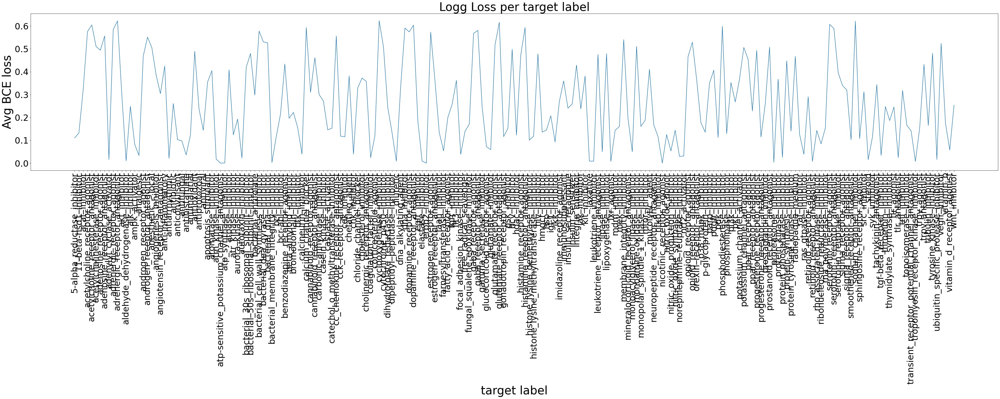

In [41]:
plt.figure(figsize = (60,10))
plt.plot(target_names, data['losses'])
plt.title('Logg Loss per target label', fontsize = 40)
plt.xlabel('target label', fontsize=40)
plt.ylabel('Avg BCE loss', fontsize = 40)
plt.xticks(rotation = 90, fontsize = 30)
plt.yticks(fontsize = 30)
plt.show()

### Bar Plot of BCE loss for first 100 target labels in the test dataset

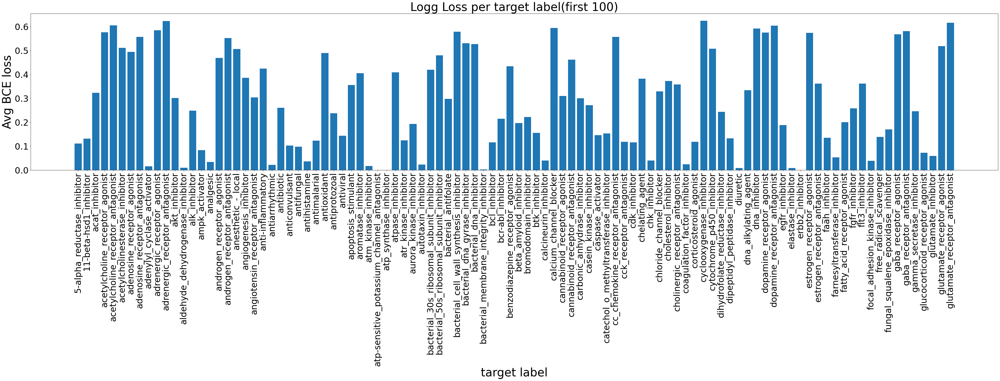

In [55]:
plt.figure(figsize = (60,10))
plt.bar(list(range(100)), data['losses'][:100], tick_label = target_names[:100])
plt.title('Logg Loss per target label(first 100)', fontsize = 40)
plt.xlabel('target label', fontsize=40)
plt.ylabel('Avg BCE loss', fontsize = 40)
plt.xticks(rotation = 90, fontsize = 30)
plt.yticks(fontsize = 30)
plt.show()

### 2. Plot of Progression of Avg. BCE Loss after each target label in the test dataset

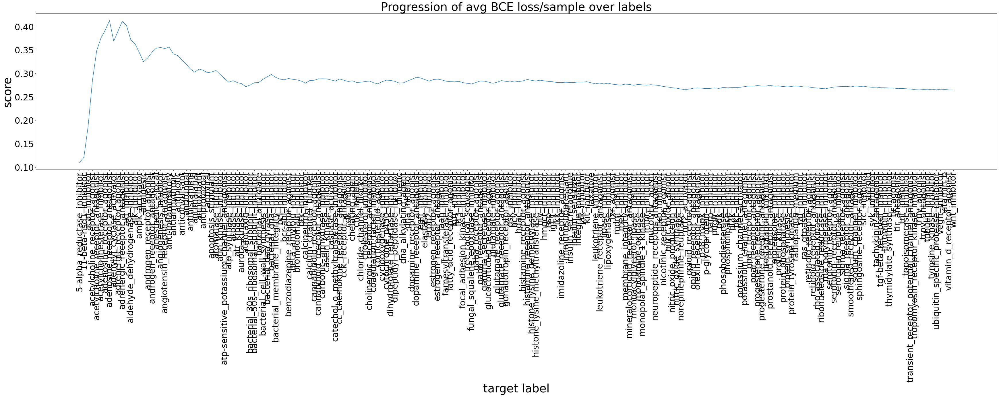

In [11]:
plt.figure(figsize = (60,10))
plt.plot(target_names, data['hamming_losses'])
plt.title('Progression of avg BCE loss/sample over labels', fontsize = 40)
plt.xlabel('target label', fontsize=40)
plt.ylabel('score', fontsize = 40)
plt.xticks(rotation = 90, fontsize = 30)
plt.yticks(fontsize = 30)
plt.show()

### 2. Plot of Progression of Avg. BCE Loss for last 100 target labels in the test dataset

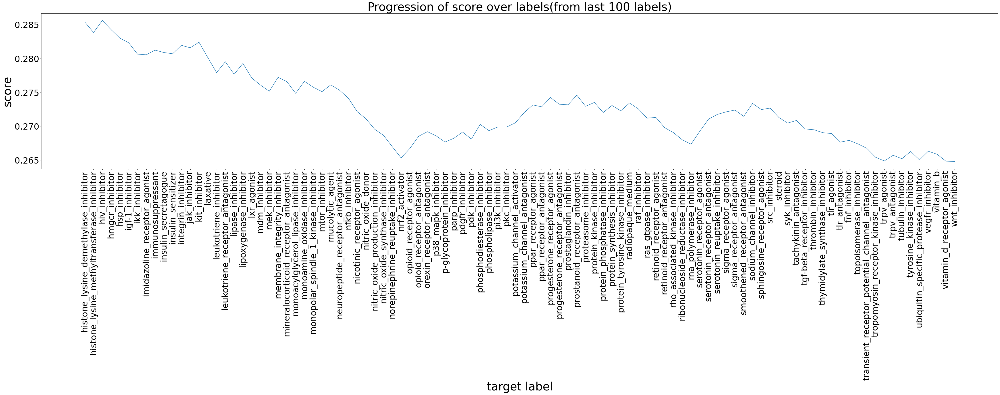

In [12]:
plt.figure(figsize = (60,10))
plt.plot(target_names[-100:], data['hamming_losses'][-100:])
plt.title('Progression of score over labels(from last 100 labels)', fontsize = 40)
plt.xlabel('target label', fontsize=40)
plt.ylabel('score', fontsize = 40)
plt.xticks(rotation = 90, fontsize = 30)
plt.yticks(fontsize = 30)
plt.show()

### 3. Overall Avg. BCE loss for the test set

In [27]:
print('Avg BCE loss for the test set: {}'.format(data['hamming_losses'][-1]))

Avg BCE loss for the test set: 0.26479358603428543


## B. Random Forest Model

In [27]:
loss = 0
losses = [] # list to store loss/label
hamming_losses = [] # list to store progression of hamming loss after each label
untrained_labels = [] # list to store labels for which no model was trained (i.e. all samples in the train set had label 0)

# Looping over each target label and fitting a separate binary classifier
for i, label in enumerate(target_names):  
  
  # Selecting relevant columns from the train and test data 
  X_train = train_data.select(['cp_time', 'cp_dose', 'pca_features'] + [label]) 
  X_test = test_data.select(['cp_time', 'cp_dose', 'pca_features'] + [label])
  one_count_train = X_train.filter(X_train[label] == 1).count() # Number of samples with label 1 in train set
  zero_count_train = X_train.filter(X_train[label] == 0).count() # Number of samples with label 0 in train set
  
  # if there are no samples in the train set with label 1, no model is trained, always output 0 for the label    
  if one_count_train == 0:
    untrained_labels.append(label) # logging the labels for which no model was trained
    # Predicted Probability will be 0 for the label in test data
    n = X_test.count()
    prob = np.array([0]*n)
    label = np.array(X_test.select(label).toPandas())[:,0]
    l = logloss(prob, label)
    print('No need to train the model. Will always output 0 for this label')
   
  # if there is atleast 1 sample in the train set with label 1, a binary classifier is fitted     
  else:
    '''
    Handling class imbalance: 
    
    If number of samples with label 0 >= 2* number of samples with label 1, then downsample (without replacement) 
    class 0 to half and then upsample (with replacement) class 1 to have same number as class 0
    '''
    factor = zero_count_train/one_count_train
    if factor>=2:
      # downsample without replacement  
      zero_samples = X_train.filter(X_train[label]==0).sample(fraction = 0.5, withReplacement = False,  seed = 0)
      # upsample with replacement  
      one_samples = spark.createDataFrame(X_train.filter(X_train[label]==1).toPandas().sample(n = int(X_train.filter(X_train[label]==0).count()/2), replace = True,  random_state = 0))
      X_train = zero_samples.union(one_samples).orderBy(rand())
    
    # Assembleing features into a vector in train and test set
    va = VectorAssembler(inputCols = ['cp_time', 'cp_dose', 'pca_features'], outputCol = 'features')
    X_train = va.transform(X_train)
    X_test = va.transform(X_test)
    
    # Fitting a Random Forest model to the train set
    randomForest = RandomForestClassifier(labelCol = label)
    print('Training Random Forest')
    randomForestModel = randomForest.fit(X_train)
    print('Random Forest Trained')
    # Testing the trained Random Forest model on the test set 
    pred_df = randomForestModel.transform(X_test)
    evaluator = MulticlassClassificationEvaluator(labelCol=label, metricName='logLoss')
    l= evaluator.evaluate(pred_df) # test loss
    
  # Logging  
  losses.append(l) # logging test loss/label
  print(f'Label Loss for {i}: {label} = {l}')
  loss+=l
  hamming_loss = loss/(i+1)
  hamming_losses.append(hamming_loss) # logging progression of hamming loss after every label 
  print(f'Hamming Loss after {i}: {label} = {hamming_loss}')
  d = {'losses': losses, 'untrained_labels': untrained_labels, 'hamming_losses': hamming_losses}
  # Writing the loss to a pickle file    
  f = open('data_rf.pkl', 'wb')
  pickle.dump(d, f)
  f.close()  
  print('################################')

Training Random Forest
Random Forest Trained
Label Loss for 0: 5-alpha_reductase_inhibitor = 0.10459986135739144
Hamming Loss after 0: 5-alpha_reductase_inhibitor = 0.10459986135739144
################################
Training Random Forest
Random Forest Trained
Label Loss for 1: 11-beta-hsd1_inhibitor = 0.12644163575566184
Hamming Loss after 1: 11-beta-hsd1_inhibitor = 0.11552074855652664
################################
Training Random Forest
Random Forest Trained
Label Loss for 2: acat_inhibitor = 0.28313202881242905
Hamming Loss after 2: acat_inhibitor = 0.1713911753084941
################################
Training Random Forest
Random Forest Trained
Label Loss for 3: acetylcholine_receptor_agonist = 0.5302801082629583
Hamming Loss after 3: acetylcholine_receptor_agonist = 0.2611134085471102
################################
Training Random Forest
Random Forest Trained
Label Loss for 4: acetylcholine_receptor_antagonist = 0.5684579005686787
Hamming Loss after 4: acetylcholine_recepto

In [28]:
with open('data_rf.pkl', 'rb') as f:
    data = pickle.load(f)

In [29]:
# Writing other model artifacts to a pickle file 
data['train_data'] = train_data.toPandas()
data['test_data'] = test_data.toPandas()
data['variance'] = pca_model.explainedVariance.toArray()
data['cumulative_variance'] = cum_var
data['correlation_matrix'] = corr_mat
data['selected_features'] = selected_features

with open('data_rf.pkl', 'wb') as f:
    pickle.dump(data, f)

##  Results

In [28]:
with open('data_rf.pkl', 'rb') as f:
    data = pickle.load(f)

### 1. Plot of BCE loss for each target label in the test dataset

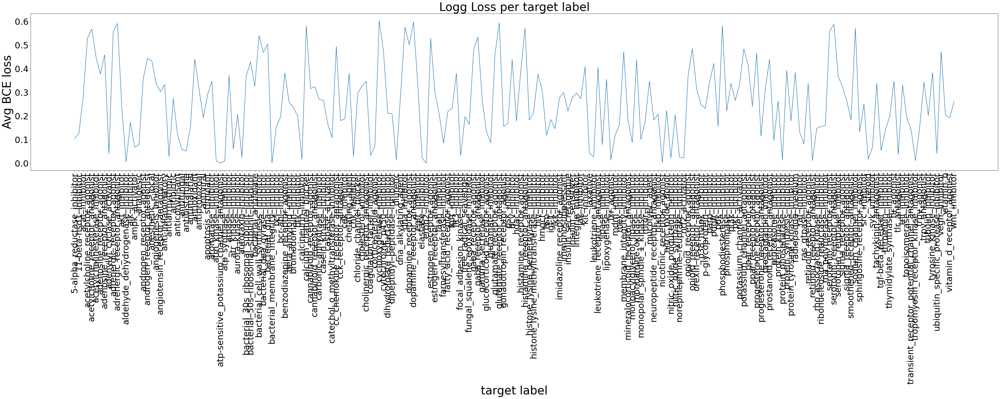

In [31]:
plt.figure(figsize = (60,10))
plt.plot(target_names, data['losses'])
plt.title('Logg Loss per target label', fontsize = 40)
plt.xlabel('target label', fontsize=40)
plt.ylabel('Avg BCE loss', fontsize = 40)
plt.xticks(rotation = 90, fontsize = 30)
plt.yticks(fontsize = 30)
plt.show()

### Bar Plot of BCE loss for first 100 target label in the test dataset

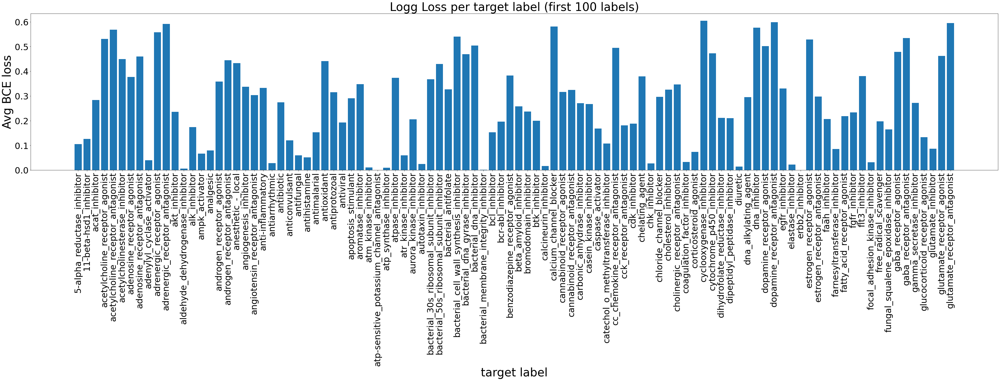

In [30]:
plt.figure(figsize = (60,10))
plt.bar(list(range(100)), data['losses'][:100], tick_label = target_names[:100])
plt.title('Logg Loss per target label (first 100 labels)', fontsize = 40)
plt.xlabel('target label', fontsize=40)
plt.ylabel('Avg BCE loss', fontsize = 40)
plt.xticks(rotation = 90, fontsize = 30)
plt.yticks(fontsize = 30)
plt.show()

### 2. Plot of Progression of Avg. BCE Loss after each target label in the test dataset

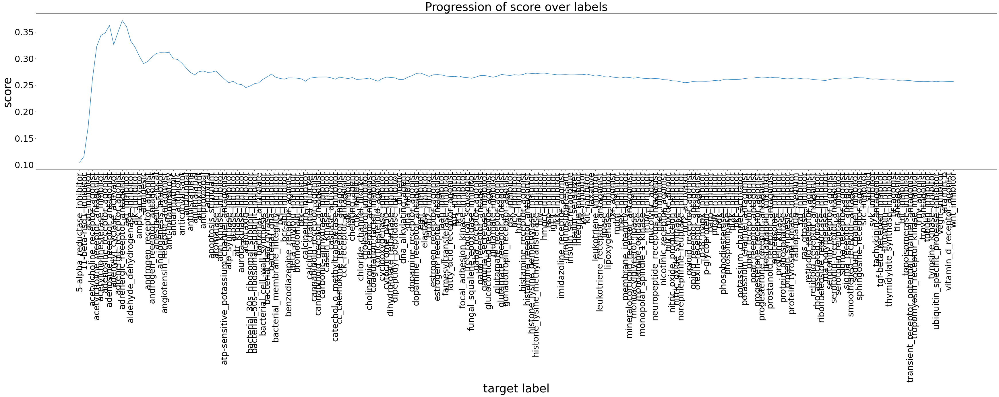

In [14]:
plt.figure(figsize = (60,10))
plt.plot(target_names, data['hamming_losses'])
plt.title('Progression of score over labels', fontsize = 40)
plt.xlabel('target label', fontsize=40)
plt.ylabel('score', fontsize = 40)
plt.xticks(rotation = 90, fontsize = 30)
plt.yticks(fontsize = 30)
plt.show()

### Plot of Progression of Avg. BCE Loss from last 100 target labels in the test dataset

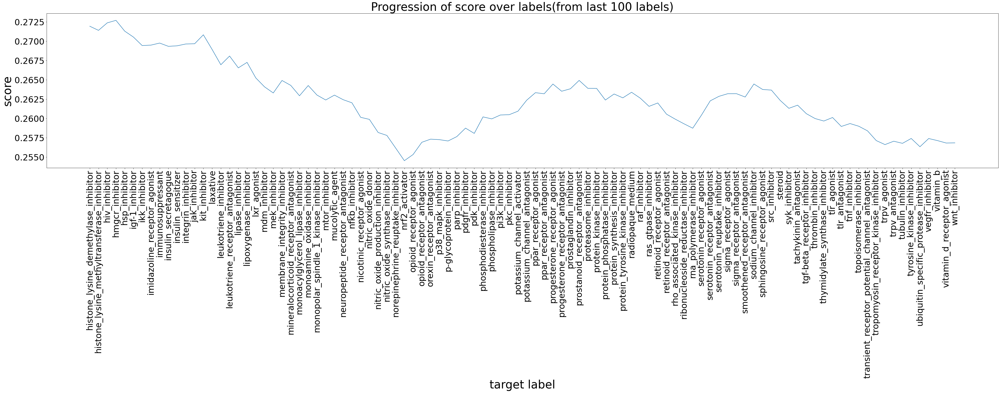

In [15]:
plt.figure(figsize = (60,10))
plt.plot(target_names[-100:], data['hamming_losses'][-100:])
plt.title('Progression of score over labels(from last 100 labels)', fontsize = 40)
plt.xlabel('target label', fontsize=40)
plt.ylabel('score', fontsize = 40)
plt.xticks(rotation = 90, fontsize = 30)
plt.yticks(fontsize = 30)
plt.show()

### 3. Overall Hamming loss for the test set

In [29]:
print('Avg. BCE loss for the test set: {}'.format(data['hamming_losses'][-1]))

Avg. BCE loss for the test set: 0.25684913777323


## C. Gradient Boosted Trees Model

In [24]:
loss = 0
losses = [] # list to store loss/label
hamming_losses = [] # list to store progression of hamming loss after each label
untrained_labels = [] # list to store labels for which no model was trained (i.e. all samples in the train set had label 0)

# Looping over each target label and fitting a separate binary classifier
for i, label in enumerate(target_names):
    
  # Selecting relevant columns from the train and test data 
  X_train = train_data.select(['cp_time', 'cp_dose', 'pca_features'] + [label])
  X_test = test_data.select(['cp_time', 'cp_dose', 'pca_features'] + [label])

  one_count_train = X_train.filter(X_train[label] == 1).count() # Number of samples with label 1 in train set
  zero_count_train = X_train.filter(X_train[label] == 0).count() # Number of samples with label 0 in train set

  # if there are no samples in the train set with label 1, no model is trained, always output 0 for the label    
  if one_count_train == 0:
    untrained_labels.append(label) # logging the labels for which no model was trained
    # Predicted Probability will be 0 for the label in test data     
    n = X_test.count()
    prob = np.array([0]*n)
    label = np.array(X_test.select(label).toPandas())[:,0]
    l = logloss(prob, label) # loss for the test set
    print('No need to train the model. Will always output 0 for this label')
  
  # if there is atleast 1 sample in the train set with label 1, a binary classifier is fitted    
  else:
    '''
    Handling class imbalance: 
    
    If number of samples with label 0 >= 2* number of samples with label 1, then downsample (without replacement) 
    class 0 to half and then upsample (with replacement) class 1 to have same number as class 0
    '''
    factor = zero_count_train/one_count_train
    if factor>=2:
      # downsample without replacement  
      zero_samples = X_train.filter(X_train[label]==0).sample(fraction = 0.5, withReplacement = False,  seed = 0) 
      # upsample with replacement  
      one_samples = spark.createDataFrame(X_train.filter(X_train[label]==1).toPandas().sample(n = int(X_train.filter(X_train[label]==0).count()/2), replace = True,  random_state = 0))
      X_train = zero_samples.union(one_samples).orderBy(rand())
    
    # Assembleing features into a vector in train and test set
    va = VectorAssembler(inputCols = ['cp_time', 'cp_dose', 'pca_features'], outputCol = 'features')
    X_train = va.transform(X_train)
    X_test = va.transform(X_test)
    
    # Fitting a GBT model to the train set
    gbt = GBTClassifier(labelCol = label)
    print('Training GBT')
    gbtModel = gbt.fit(X_train)
    print('GBT Trained')
    
    # Testing the trained GBT model on the test set 
    pred_df = gbtModel.transform(X_test)
    evaluator = MulticlassClassificationEvaluator(labelCol=label, metricName='logLoss')
    l= evaluator.evaluate(pred_df) # test loss
  
  # Logging
  losses.append(l) # logging test loss/label
  print(f'Label Loss for {i}: {label} = {l}')
  loss+=l
  hamming_loss = loss/(i+1)
  hamming_losses.append(hamming_loss) # logging progression of hamming loss after every label 
  print(f'Hamming Loss after {i}: {label} = {hamming_loss}')
  d = {'losses': losses, 'untrained_labels': untrained_labels, 'hamming_losses': hamming_losses }
  # Writing the loss to a pickle file   
  f = open('data_untuned.pkl', 'wb')
  pickle.dump(d, f)
  f.close()  
  print('################################')

Training GBT
GBT Trained
Label Loss for 0: 5-alpha_reductase_inhibitor = 0.06247522902359907
Hamming Loss after 0: 5-alpha_reductase_inhibitor = 0.06247522902359907
################################
Training GBT
GBT Trained
Label Loss for 1: 11-beta-hsd1_inhibitor = 0.06245920061161403
Hamming Loss after 1: 11-beta-hsd1_inhibitor = 0.062467214817606545
################################
Training GBT
GBT Trained
Label Loss for 2: acat_inhibitor = 0.08356878860673383
Hamming Loss after 2: acat_inhibitor = 0.06950107274731564
################################
Training GBT
GBT Trained
Label Loss for 3: acetylcholine_receptor_agonist = 0.2248410104407507
Hamming Loss after 3: acetylcholine_receptor_agonist = 0.1083360571706744
################################
Training GBT
GBT Trained
Label Loss for 4: acetylcholine_receptor_antagonist = 0.3131136563661688
Hamming Loss after 4: acetylcholine_receptor_antagonist = 0.14929157700977327
################################
Training GBT
GBT Trained
Label

In [27]:
with open('data_untuned.pkl', 'rb') as f:
    data = pickle.load(f)

In [33]:
# Writing other model artifacts to a pickle file 
data['train_data'] = train_data.toPandas()
data['test_data'] = test_data.toPandas()
data['variance'] = pca_model.explainedVariance.toArray()
data['cumulative_variance'] = cum_var
data['correlation_matrix'] = corr_mat
data['selected_features'] = selected_features

with open('data_untuned.pkl', 'wb') as f:
    pickle.dump(data, f)

##  Results

In [30]:
with open('data_untuned.pkl', 'rb') as f:
    data = pickle.load(f)

### 1. Plot of BCE loss for each target label in the test dataset

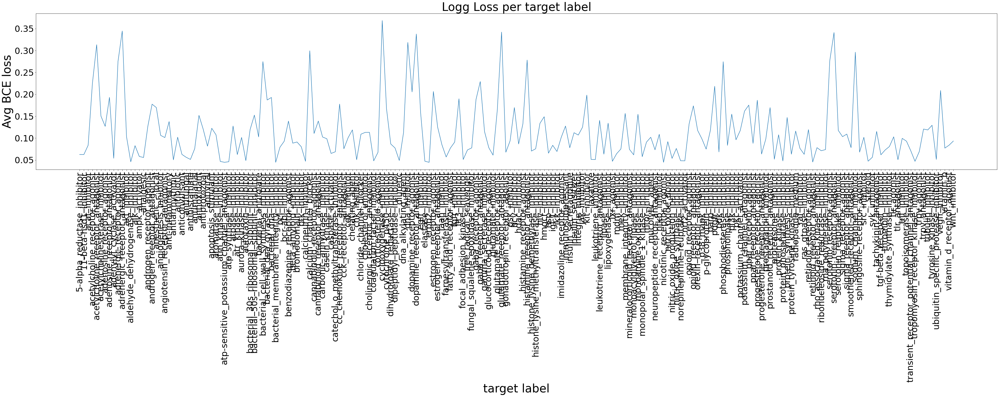

In [20]:
plt.figure(figsize = (60,10))
plt.plot(target_names, data['losses'])
plt.title('Logg Loss per target label', fontsize = 40)
plt.xlabel('target label', fontsize=40)
plt.ylabel('Avg BCE loss', fontsize = 40)
plt.xticks(rotation = 90, fontsize = 30)
plt.yticks(fontsize = 30)
plt.show()

### Bar Plot of BCE loss for first 100 target labels in the test dataset

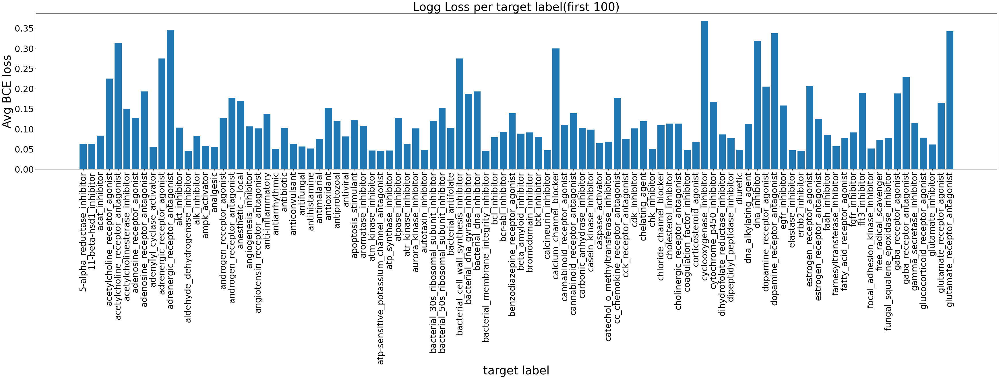

In [20]:
plt.figure(figsize = (60,10))
plt.bar(list(range(100)), data['losses'][:100], tick_label = target_names[:100])
plt.title('Logg Loss per target label(first 100)', fontsize = 40)
plt.xlabel('target label', fontsize=40)
plt.ylabel('Avg BCE loss', fontsize = 40)
plt.xticks(rotation = 90, fontsize = 30)
plt.yticks(fontsize = 30)
plt.show()

### 2. Plot of Pogression of Avg. BCE Loss after each target label in the test dataset

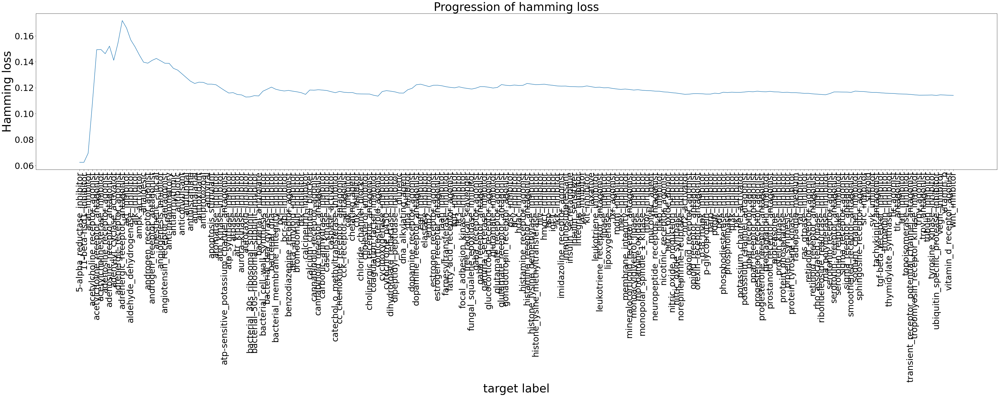

In [31]:
plt.figure(figsize = (60,10))
plt.plot(target_names, data['hamming_losses'])
plt.title('Progression of hamming loss', fontsize = 40)
plt.xlabel('target label', fontsize=40)
plt.ylabel('Hamming loss', fontsize = 40)
plt.xticks(rotation = 90, fontsize = 30)
plt.yticks(fontsize = 30)
plt.show()

### Plot of Pogression of Avg. BCE Loss for last 100 targets label in the test dataset

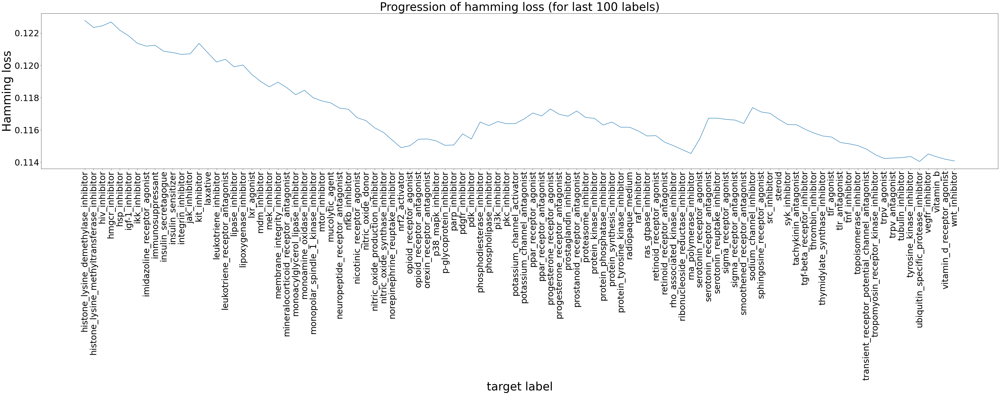

In [22]:
plt.figure(figsize = (60,10))
plt.plot(target_names[-100:], data['hamming_losses'][-100:])
plt.title('Progression of hamming loss (for last 100 labels)', fontsize = 40)
plt.xlabel('target label', fontsize=40)
plt.ylabel('Hamming loss', fontsize = 40)
plt.xticks(rotation = 90, fontsize = 30)
plt.yticks(fontsize = 30)
plt.show()

### 3. Overall Hamming loss for the test set

In [31]:
print('Avg. BCE loss for the test set: {}'.format(data['hamming_losses'][-1]))

Avg. BCE loss for the test set: 0.11406681532552644


## Hyperparameter Tuning

## Stratified K-Fold Cross Validator

In [33]:
'''
Implementation of Stratified K-Fold Cross Validation: 

Adapted from: https://github.com/interviewstreet/spark-stratifier

Since train data is highly imbalanced, stratified cross validation approach is taken
'''
import itertools
import numpy as np
from pyspark import since, keyword_only
from pyspark.ml import Estimator, Model
from pyspark.ml.common import _py2java
from pyspark.ml.param import Params, Param, TypeConverters
from pyspark.ml.param.shared import HasSeed
from pyspark.ml.tuning import CrossValidator, CrossValidatorModel
from pyspark.ml.util import *
from pyspark.ml.wrapper import JavaParams
from pyspark.sql.functions import rand
from functools import reduce
from multiprocessing.pool import ThreadPool

class StratifiedCrossValidator(CrossValidator):
  def stratify_data(self, dataset):
    """
    Returns an array of dataframes with the same ratio of passes and failures.

    Currently only supports binary classification problems.
    """

    epm = self.getOrDefault(self.estimatorParamMaps)
    numModels = len(epm)
    nFolds = self.getOrDefault(self.numFolds)
    split_ratio = 1.0 / nFolds

    passes = dataset[dataset['label'] == 1]
    fails = dataset[dataset['label'] == 0]

    pass_splits = passes.randomSplit([split_ratio for i in range(nFolds)])
    fail_splits = fails.randomSplit([split_ratio for i in range(nFolds)])
    
    '''
    For every split, if (number of samples with label 0)/(number of samples with label 1) > 2, downsample number of 
    samples with label 0 (without replacement) by half and then upsample number of samples with label 0 (with replacement)
    so as to have the same count as number of samples of label 0
    '''
    for i in range(len(pass_splits)):
      one_count_train = pass_splits[i].count()
      zero_count_train = fail_splits[i].count()
      factor = zero_count_train/one_count_train
      if factor > 2:
        fail_splits[i] = fail_splits[i].sample(fraction = 0.5, withReplacement = False,  seed = 0) 
        pass_splits[i] = spark.createDataFrame(pass_splits[i].toPandas().sample(n = fail_splits[i].count(), replace = True,  random_state = 0))
    
    
    stratified_data = [pass_splits[i].unionAll(fail_splits[i]) for i in range(nFolds)]

    return stratified_data

  def _fit(self, dataset):
    '''
    Fits the model with different hyperparameter settings, performs k fold cross validation to return the avg metrics
    , best model, best parameters etc.
    '''    
    est = self.getOrDefault(self.estimator) # estimator
    epm = self.getOrDefault(self.estimatorParamMaps) # dictionary of hyperparameters
    numModels = len(epm) # number of different hyperparameter settings
    eva = self.getOrDefault(self.evaluator)
    nFolds = self.getOrDefault(self.numFolds) # number of folds
    seed = self.getOrDefault(self.seed) # seeds
    metrics = [0.0] * numModels # list to store avg K-Fold metric score for each hyperparameter setting
    
    stratified_data = self.stratify_data(dataset) # Get stratified train-val splits
    
    '''
    Performinh K fold validtion, on stratified train-val split and returns the model with 
    '''
    for i in range(nFolds):
      train_arr = [x for j,x in enumerate(stratified_data) if j != i]
      train = reduce((lambda x, y: x.unionAll(y)), train_arr)
      validation = stratified_data[i]

      models = est.fit(train, epm)

      for j in range(numModels):
        model = models[j]
        metric = eva.evaluate(model.transform(validation, epm[j]))
        metrics[j] += metric/nFolds

    if eva.isLargerBetter():
      bestIndex = np.argmax(metrics)
    else:
      bestIndex = np.argmin(metrics)

    bestModel = est.fit(dataset, epm[bestIndex])
    return self._copyValues(CrossValidatorModel(bestModel, metrics))


## Training - K-Fold Cross Validation - Testing 

In [63]:
losses = [] # List to store BCE test loss every label
val_loss = [] # List of lists where each inside list stores avg K-fold validation loss for every hyperparameter setting
best_params = [] # list of dictionaries, where each dictinary stores the best hyperparameter values
total_loss = 0 # tracking the total loss after every label
hamming_losses = [] # list to store the progression of hamming loss

# Going over each target label and training a seperate model
for i, label in enumerate(target_names):
    
  # Selecting relevant columns from the train and test data and renaming the target label column to 'label' (required for stratified cross validator)    
  X_train = train_data.select(['cp_time', 'cp_dose', 'pca_features'] + [label]).withColumnRenamed(label,'label')
  X_test = test_data.select(['cp_time', 'cp_dose', 'pca_features'] + [label]).withColumnRenamed(label, 'label')
  
  # Assembling the features to a vector    
  va = VectorAssembler(inputCols = ['cp_time', 'cp_dose', 'pca_features'], outputCol = 'features')
    
  # Repartitioning X_train to 1 partition (done to leverage parallelization during cross-validation)    
  X_train = va.transform(X_train).coalesce(1)
  X_test = va.transform(X_test)

  # Instantiating GBT model    
  gbt = GBTClassifier(labelCol = 'label')
  
  # Defining the evaluator     
  evaluator = MulticlassClassificationEvaluator(labelCol='label', metricName='logLoss')
    
  # Building the grid of parameters     
  params = ParamGridBuilder().addGrid(gbt.maxIter, [20,30]).addGrid(gbt.maxDepth, [5,10]).build()
  
  # Performing startified K-Fold Cross validation      
  print('Cross Validating')
  scv = StratifiedCrossValidator(estimator=gbt, estimatorParamMaps=params, evaluator=evaluator, numFolds=3, seed=42, parallelism=2)
  scv_model = scv.fit(X_train)
  print('Cross Validaton done')
    
  # Logging  
  best_model = scv_model.bestModel # best model
  val_loss.append(scv_model.avgMetrics) # logging validation metrics
  param_dict = {'maxIter': best_model.getMaxIter(), 'maxDepth': best_model.getMaxDepth()} 
  best_params.append(param_dict) # logging best hyperparameter settings
  
  # Testing the best model on the test set   
  pred_df = scv_model.transform(X_test)
  l= evaluator.evaluate(pred_df)
  
  # Logging     
  losses.append(l) # logging test loss for every label
  print(f'Label Loss for {i}: {label} = {l}')
  total_loss+=l
  hamming_loss = total_loss/(i+1)  
  hamming_losses.append(hamming_loss) # logging hamming loss after every label 
  print(f'Hamming Loss after {i}: {label} = {hamming_loss}')

  # Writing data to pickle file   
  d = {'test_losses': losses, 'val_losses': val_loss, 'best_params':best_params, 'hamming_losses': hamming_losses}
  f = open('data_tuned.pkl', 'wb')
  pickle.dump(d, f)
  f.close()  
  print('################################')

Cross Validating
Cross Validaton done
Label Loss for 0: 5-alpha_reductase_inhibitor = 0.03457635926845083
Hamming Loss after 0: 5-alpha_reductase_inhibitor = 0.03457635926845083
################################
Cross Validating
Cross Validaton done
Label Loss for 1: 11-beta-hsd1_inhibitor = 0.035363116591408644
Hamming Loss after 1: 11-beta-hsd1_inhibitor = 0.03496973792992974
################################
Cross Validating
Cross Validaton done
Label Loss for 2: acat_inhibitor = 0.03419740021890976
Hamming Loss after 2: acat_inhibitor = 0.03471229202625641
################################
Cross Validating
Cross Validaton done
Label Loss for 3: acetylcholine_receptor_agonist = 0.05536741676066395
Hamming Loss after 3: acetylcholine_receptor_agonist = 0.039876073209858295
################################
Cross Validating
Cross Validaton done
Label Loss for 4: acetylcholine_receptor_antagonist = 0.08459099362984276
Hamming Loss after 4: acetylcholine_receptor_antagonist = 0.048819057293

In [64]:
# Reading the pickle file
with open('data_tuned.pkl', 'rb') as f:
    data = pickle.load(f)

In [70]:
# Storing other model artifacts into the pickle file

data['train_data'] = train_data.toPandas()
data['test_data'] = test_data.toPandas()
data['hamming_losses'] = hamming_losses
data['variance'] = pca_model.explainedVariance.toArray()
data['cumulative_variance'] = cum_var
data['correlation_matrix'] = corr_mat
data['selected_features'] = selected_features

with open('data.pkl', 'wb') as f:
    pickle.dump(data1, f)

## Results

### 1. Plot of BCE loss for each target label in the test dataset

In [32]:
# Reading the pickle file
with open('data_tuned.pkl', 'rb') as f:
    data = pickle.load(f)

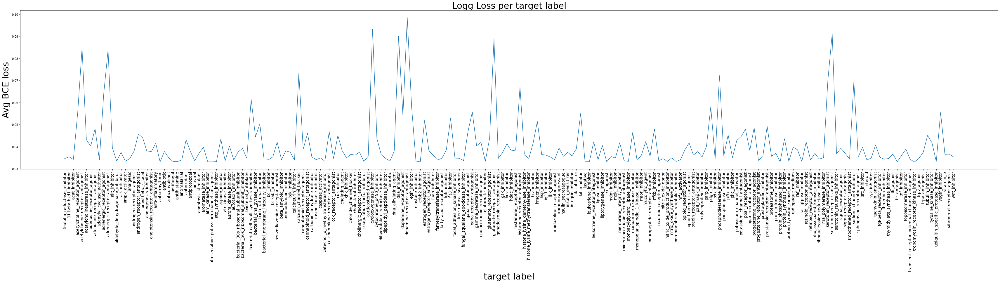

In [66]:
# Plotting test loss/label
plt.figure(figsize = (60,10))
plt.plot(target_names, data['test_losses'])
plt.title('Logg Loss per target label', fontsize = 30)
plt.xlabel('target label', fontsize=30)
plt.ylabel('Avg BCE loss', fontsize = 30)
plt.xticks(rotation = 90, fontsize = 14)
plt.show()

### 2. Plot of Pogression of Hamming Loss after each target label in the test dataset

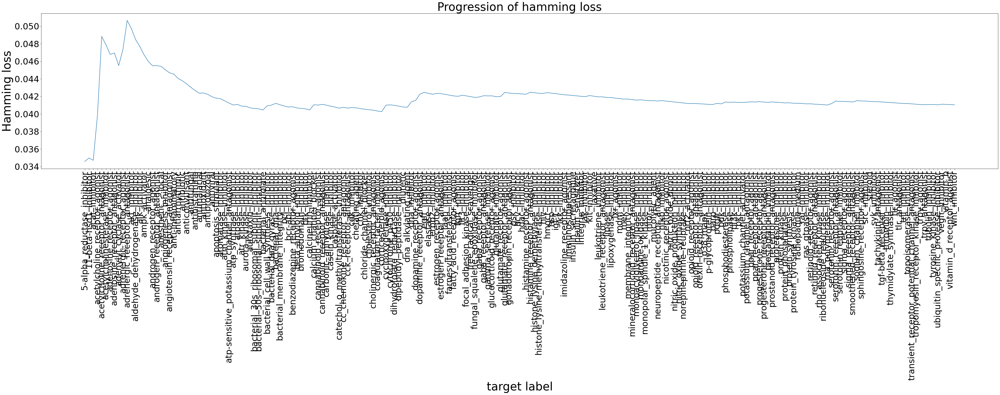

In [22]:
plt.figure(figsize = (60,10))
plt.plot(target_names, data['hamming_losses'])
plt.title('Progression of hamming loss', fontsize = 40)
plt.xlabel('target label', fontsize=40)
plt.ylabel('Hamming loss', fontsize = 40)
plt.xticks(rotation = 90, fontsize = 30)
plt.yticks(fontsize = 30)
plt.show()

### 3. Overall Hamming loss for the test set

In [33]:
print('Avg BCE loss for the test set: {}'.format(data['hamming_losses'][-1]))

Avg BCE loss for the test set: 0.041032233144372585


## Comparison of tuned GBT with untunted GBT

In [34]:
with open('data_tuned.pkl', 'rb') as f:
    data_tuned = pickle.load(f)

In [35]:
with open('data_untuned.pkl', 'rb') as f:
    data_untuned = pickle.load(f)

### 1. Comparing BCE loss per target label in test dataset

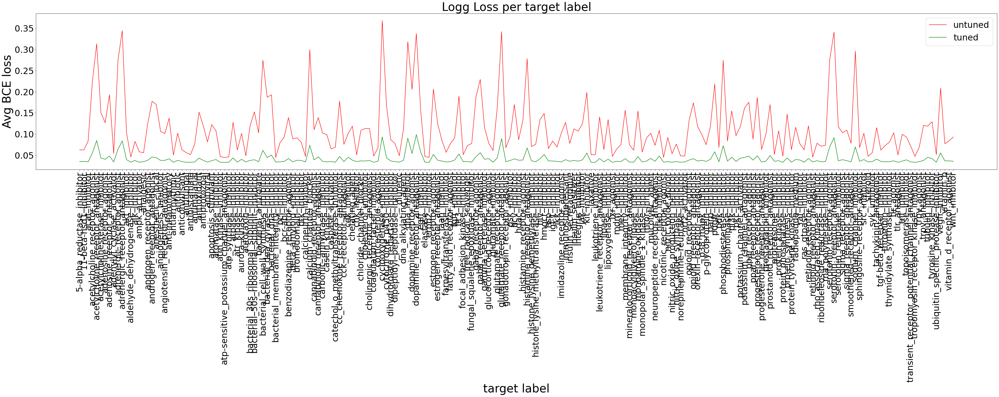

In [26]:
test_loss_tuned = data_tuned['test_losses']
test_loss_untuned = data_untuned['losses']
plt.figure(figsize = (60,10))
plt.plot(target_names, test_loss_untuned, color = 'red', label = 'untuned')
plt.plot(target_names, test_loss_tuned, color = 'green', label = 'tuned')
plt.title('Logg Loss per target label', fontsize = 40)
plt.xlabel('target label', fontsize=40)
plt.ylabel('Avg BCE loss', fontsize = 40)
plt.xticks(rotation = 90, fontsize = 30)
plt.yticks(fontsize = 30)
plt.legend(fontsize = 30)
plt.show()

### Comparing BCE loss per target label for first 100 labels in test dataset

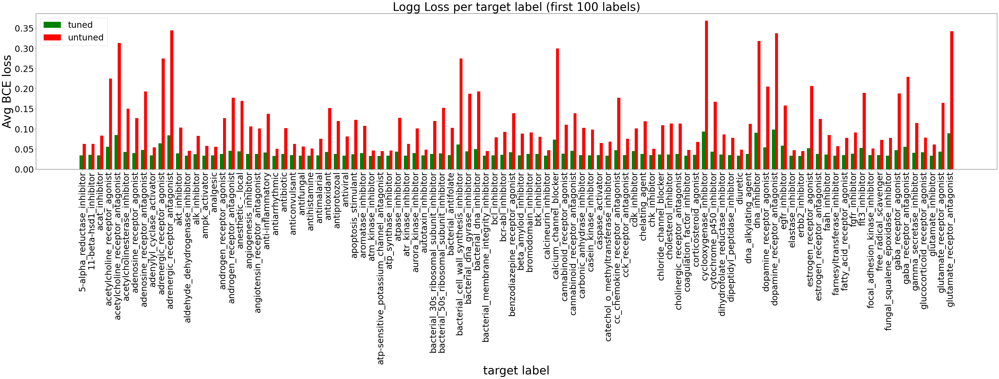

In [53]:
plt.figure(figsize = (60,10))
width = 0.35
ind = np.arange(len(target_names[:100]))
plt.bar(ind - width/2, data_tuned['test_losses'][:100], width, label = 'tuned', color = 'green')
plt.bar(ind + width/2, data_untuned['losses'][:100], width, label = 'untuned', color = 'red')
plt.title('Logg Loss per target label (first 100 labels)', fontsize = 40)
plt.xlabel('target label', fontsize=40)
plt.ylabel('Avg BCE loss', fontsize = 40)
plt.xticks(range(0,len(target_names[:100])), target_names[:100], rotation = 90, fontsize = 30)
plt.yticks(fontsize = 30)
plt.legend(fontsize = 30)
plt.show()


### 2. Comparing Progression of Hamming Loss after each label in test data

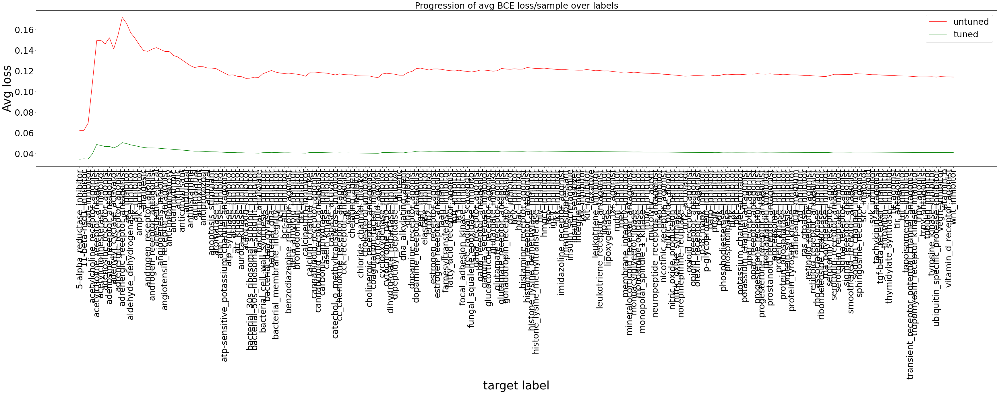

In [36]:
hamming_loss_tuned = data_tuned['hamming_losses']
hamming_loss_untuned = data_untuned['hamming_losses']

plt.figure(figsize = (60,10))
plt.plot(target_names, hamming_loss_untuned, color = 'red', label = 'untuned')
plt.plot(target_names, hamming_loss_tuned, color = 'green', label = 'tuned')
plt.title('Progression of avg BCE loss/sample over labels', fontsize = 30)
plt.xlabel('target label', fontsize=40)
plt.ylabel('Avg loss', fontsize = 40)
plt.xticks(rotation = 90, fontsize = 30)
plt.yticks(fontsize = 30)
plt.legend(fontsize = 30)
plt.show()

### 2. Comparing Progression of Avg. BCE Loss each label from last 100 labels in test data

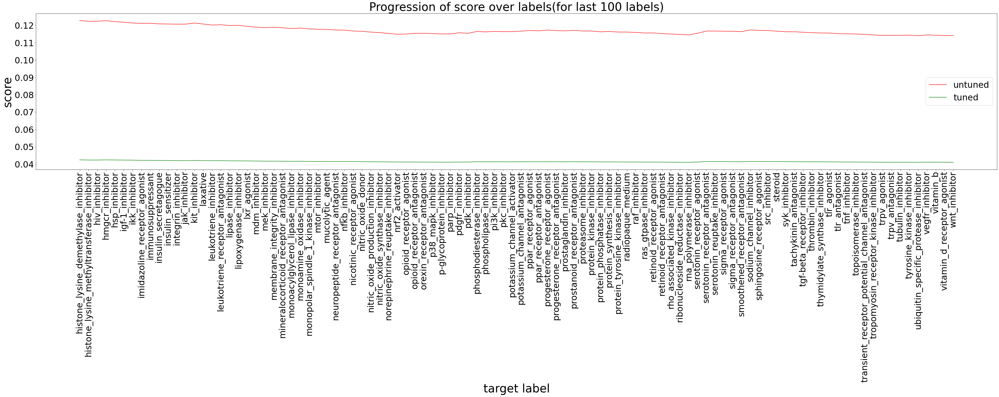

In [19]:
hamming_loss_tuned = data_tuned['hamming_losses']
hamming_loss_untuned = data_untuned['hamming_losses']

plt.figure(figsize = (60,10))
plt.plot(target_names[-100:], hamming_loss_untuned[-100:], color = 'red', label = 'untuned')
plt.plot(target_names[-100:], hamming_loss_tuned[-100:], color = 'green', label = 'tuned')
plt.title('Progression of score over labels(for last 100 labels)', fontsize = 40)
plt.xlabel('target label', fontsize=40)
plt.ylabel('score', fontsize = 40)
plt.xticks(rotation = 90, fontsize = 30)
plt.yticks(fontsize = 30)
plt.legend(fontsize = 30)
plt.show()

### 3. Comparing Overall BCE loss for the test set

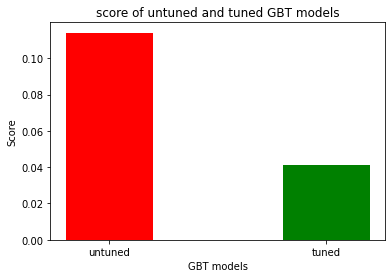

In [20]:
hamming_tuned = data_tuned['hamming_losses'][-1]
hamming_untuned = data_untuned['hamming_losses'][-1]
plt.bar([2,4], [hamming_untuned, hamming_tuned], color = ['red', 'green'], tick_label = ['untuned','tuned'])
plt.xlabel('GBT models')
plt.ylabel('Score')
plt.title('score of untuned and tuned GBT models')
plt.show()

### 4. Comparing of Hyperparameters [Iterations and Depth]

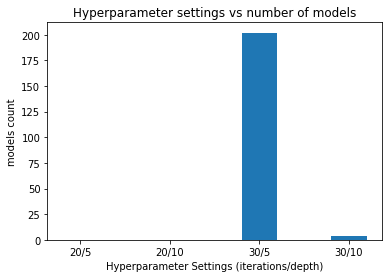

In [66]:
d = {'20/5': 0, '20/10': 0, '30/5': 0, '30/10': 0} # dictionary to store count of models using particular hyperparameter settings

for i in data_tuned['best_params']:    
    if i['maxIter'] == 20 and i['maxDepth'] == 5:
        d['20/5'] += 1
    elif i['maxIter'] == 20 and i['maxDepth'] == 10:
        d['20/10'] += 1
    elif i['maxIter'] == 30 and i['maxDepth'] == 5:
        d['30/5'] += 1
    else:
        d['30/10'] += 1
        
plt.bar([2,4,6, 8], list(d.values()), tick_label = list(d.keys()))
plt.xlabel('Hyperparameter Settings (iterations/depth)')
plt.ylabel('models count')
plt.title('Hyperparameter settings vs number of models')
plt.show()

The two most important hyperparameters for GBM are the number of iterations and tree depth. Initially the untuned model used a default setting of 20 iterations and depth of 5. After running cross validation and doing grid search, we found a better setting for the hyperparameter to be 30 iterations, 5/10 tree depth.

Our interpretation for this set of hyperparameters: increasing the max iteration allows the GBM to have more trees in the ensemble thus allowing the GBM to better model the residual. Furthermore, increasing the tree depth enables more splits on potentially important features that we will otherwise not be able to observe with a lower tree depth restriction. Hence, it can be inferred that, the untuned GBT model was an underfit.